<a href="https://colab.research.google.com/github/brendanfoo/brendanfoo/blob/main/207_Final_Presentation_Facial_Keypoint_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# W207 Final Presentation - Facial Keypoints Detection (Convolutional Neural Networks)
## Team: Dhangur Singh, Robert Meyer, Noor-Ul-Ain Ali, Brendan Foo

# Importing libraries & Data from Kaggle
Data Source: https://www.kaggle.com/c/facial-keypoints-detection


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import random

from numpy import mean
from numpy import std
from sklearn.model_selection import KFold
from tensorflow import keras
import tensorflow as tf
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import LeakyReLU
from keras.layers import BatchNormalization
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Flatten
from keras.optimizers import SGD
from scipy import ndimage, misc

import statsmodels.api as sm
import statsmodels.formula.api as smf

alt.data_transformers.enable('default', max_rows=None)

DataTransformerRegistry.enable('default')

In [ ]:
# connect drive to colab to load data
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
data_file = "/content/drive/MyDrive/w207/IdLookupTable.csv"
idlookuptable = pd.read_csv(data_file)
print(idlookuptable.shape)
idlookuptable.head(2)

(27124, 4)


,RowId,ImageId,FeatureName,Location
0,1,1,left_eye_center_x,NaN
1,2,1,left_eye_center_y,NaN


In [ ]:
train = pd.read_csv("/content/drive/MyDrive/w207/train.csv")
print(train.shape)
train.head(3)

(7049, 31)


,left_eye_center_x,left_eye_center_y,right_eye_center_x,right_eye_center_y,left_eye_inner_corner_x,left_eye_inner_corner_y,left_eye_outer_corner_x,left_eye_outer_corner_y,right_eye_inner_corner_x,right_eye_inner_corner_y,...,nose_tip_y,mouth_left_corner_x,mouth_left_corner_y,mouth_right_corner_x,mouth_right_corner_y,mouth_center_top_lip_x,mouth_center_top_lip_y,mouth_center_bottom_lip_x,mouth_center_bottom_lip_y,Image
0,66.033564,39.002274,30.227008,36.421678,59.582075,39.647423,73.130346,39.969997,36.356571,37.389402,...,57.066803,61.195308,79.970165,28.614496,77.388992,43.312602,72.935459,43.130707,84.485774,238 236 237 238 240 240 239 241 241 243 240 23...
1,64.332936,34.970077,29.949277,33.448715,58.856170,35.274349,70.722723,36.187166,36.034723,34.361532,...,55.660936,56.421447,76.352000,35.122383,76.047660,46.684596,70.266553,45.467915,85.480170,219 215 204 196 204 211 212 200 180 168 178 19...
2,65.057053,34.909642,30.903789,34.909642,59.412000,36.320968,70.984421,36.320968,37.678105,36.320968,...,53.538947,60.822947,73.014316,33.726316,72.732000,47.274947,70.191789,47.274947,78.659368,144 142 159 180 188 188 184 180 167 132 84 59 ...


In [ ]:
test = pd.read_csv("/content/drive/MyDrive/w207/test.csv")
print(test.shape)
test.head(1)

(1783, 2)


,ImageId,Image
0,1,182 183 182 182 180 180 176 169 156 137 124 10...


**Data files:**<br>
**train.csv:** list of training 7049 images. Each row contains the (x,y) coordinates for 15 keypoints, and image data as row-ordered list of pixels.<br>
**test.csv:** list of 1783 test images. Each row contains ImageId and image data as row-ordered list of pixels.

# Exploratory Data Analysis & Investigating Null Values

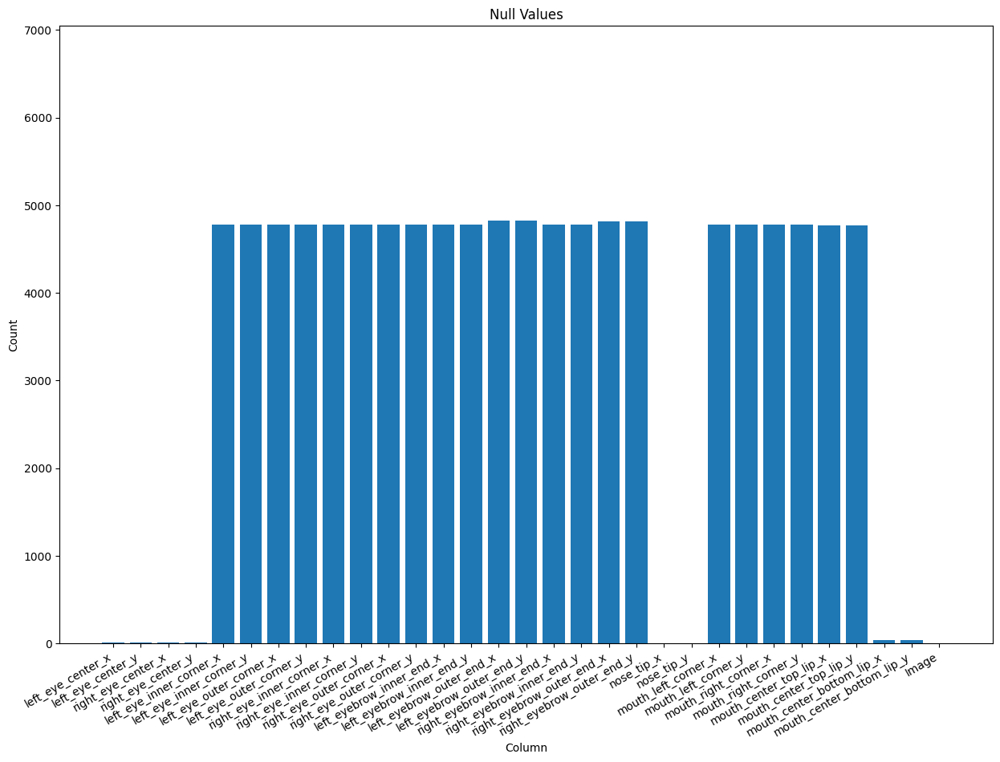

In [ ]:
null_counts = train.isna().sum().values
columns = train.isna().sum().index

fig, ax = plt.subplots(figsize = (15, 10))
ax.bar(columns, null_counts)
plt.title('Null Values')
plt.ylabel('Count')
plt.xlabel('Column')
plt.ylim(top = train.shape[0])
plt.xticks(rotation=30, ha='right');

## Functions to Process Images and Plot Keypoints

In [ ]:
def process_img(data):
  """add fucntion description"""
  images = []
  for idx, sample in data.iterrows():
      image = np.array(sample['Image'].split(' '), dtype=float)
      image = np.reshape(image, (96,96,1))
      images.append(image)
  images = np.array(images)/255
  return images

In [ ]:
X_train = process_img(train)
Y_train = train.drop("Image", axis=1).to_numpy()

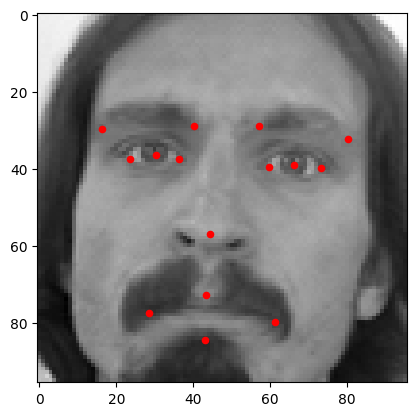

In [ ]:
def plot_1_image(image, keypoints):
  """
  image: one entry from X_train
  keypoints: one entry from Y_train
  """
  fig, ax = plt.subplots()
  ax.imshow(image.reshape(96,96), cmap = 'gray')
  ax.scatter(keypoints[0::2], keypoints[1::2], marker='o', s=20, color='r')
  plt.show()

plot_1_image(X_train[0], Y_train[0])

## Distribution of Facial Keypoints

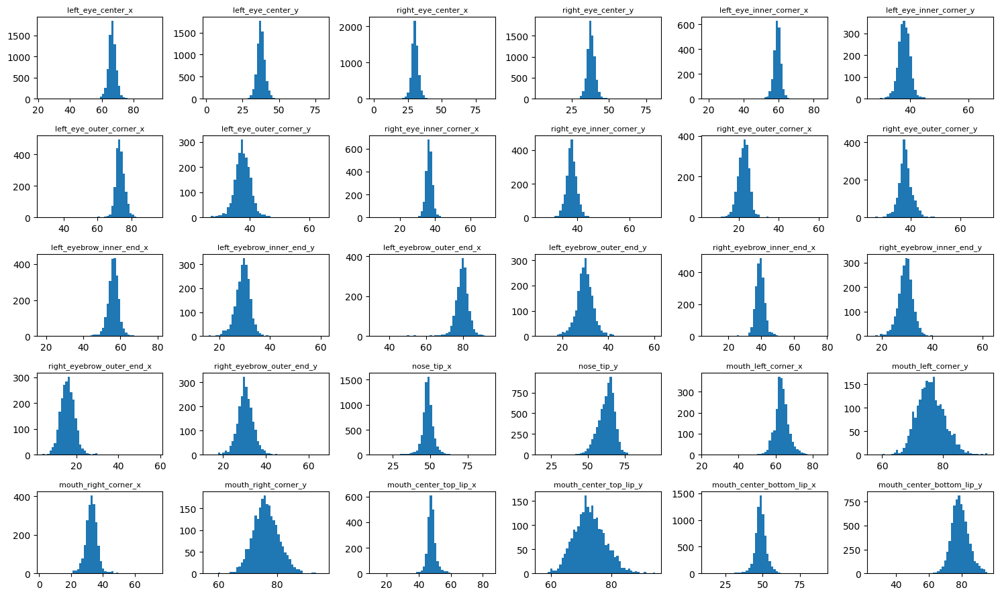

In [ ]:
fig, axes = plt.subplots(5, 6, figsize=(15, 9))
ax = axes.ravel()
for i in range(30):
  ax[i].hist(train[train.columns[i]], bins=50)
  ax[i].set_title(train.columns[i],fontsize=8)
plt.tight_layout()

In [ ]:
graph = train.drop("Image", axis=1)
graph2=graph.melt()

alt.Chart(graph2).mark_boxplot(size=40).encode(
    x=alt.X('variable:O', title='Keypoint'),
    y=alt.Y('value:Q', title='Values')
).properties(title="Distribution of Facial Keypoint Identifiers", height=450, width=1200
).interactive()

alt.Chart(...)

## Investigating Relationships between Features

<ipython-input-12-48dc01829489>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr=df.corr()


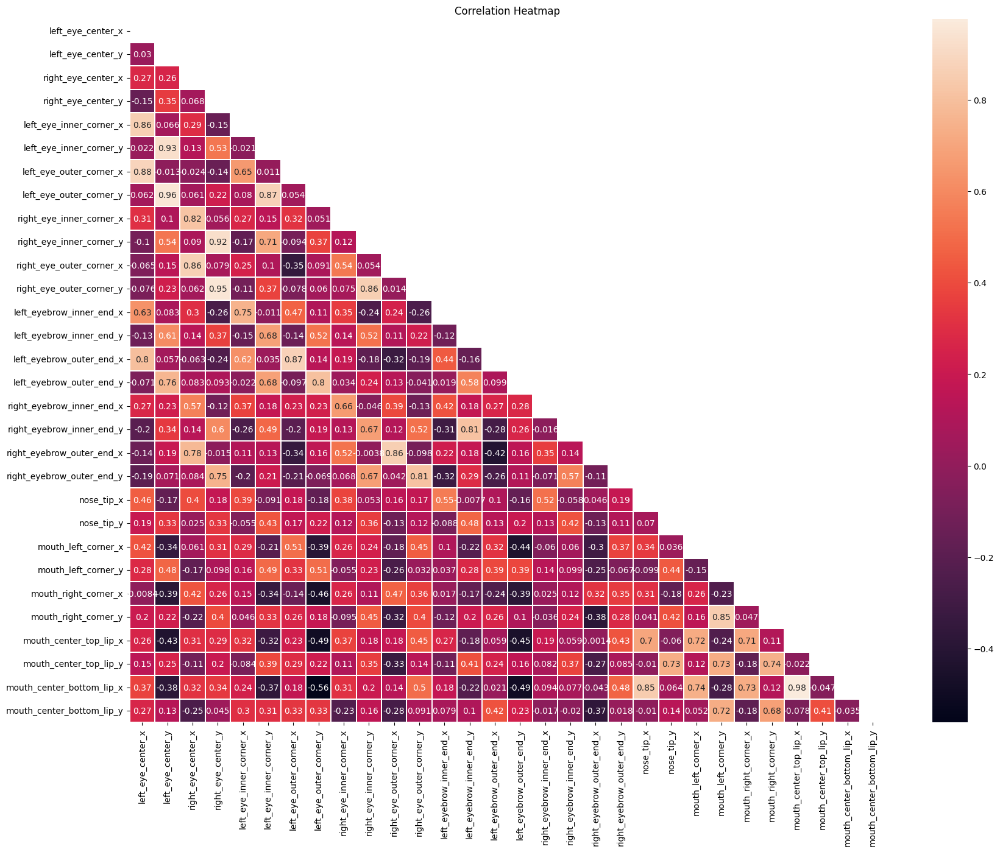

In [ ]:
def corr_matrix(df, title):
    plt.figure(figsize = (20, 15))
    plt.title(title)
    corr=df.corr()
    sns.heatmap(corr, annot=True, mask=np.triu(corr), linewidths=.3)

corr_matrix(train, "Correlation Heatmap")

### Root Mean Square Error Formula:

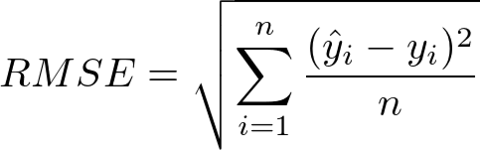



# Model 1: Baseline Model with only complete data (all nulls dropped)

In [ ]:
drop_nulls = train.dropna()
X_train_1 = process_img(drop_nulls)
Y_train_1 = drop_nulls.drop("Image", axis=1).to_numpy()

In [ ]:
def define_model_1():
  model = Sequential()

  model.add(Conv2D(64, (3, 3), activation='relu', input_shape=(96, 96, 1)))
  model.add(MaxPooling2D((2, 2)))
  model.add(Conv2D(32, (3, 3), activation='relu'))
  model.add(MaxPooling2D((2, 2)))

  model.add(Flatten())
  model.add(Dense(70, activation='relu'))
  model.add(Dropout(0.1))
  model.add(Dense(30, activation='relu'))

  # compile model
  opt = keras.optimizers.Adam(learning_rate=0.001)
  model.compile(optimizer=opt, loss='mean_squared_error', metrics=[keras.metrics.RootMeanSquaredError()])
  return model

In [ ]:
model_1 = define_model_1()
#tf.random.set_seed(100)
history = model_1.fit(X_train_1, Y_train_1, epochs = 10, batch_size = 32, validation_split = 0.2)

Epoch 1/10
54/54 [==============================] - 5s 19ms/step - loss: 1210.6371 - root_mean_squared_error: 34.7942 - val_loss: 635.1923 - val_root_mean_squared_error: 25.2030
Epoch 2/10
54/54 [==============================] - 1s 11ms/step - loss: 435.6332 - root_mean_squared_error: 20.8718 - val_loss: 216.5216 - val_root_mean_squared_error: 14.7147
Epoch 3/10
54/54 [==============================] - 1s 12ms/step - loss: 260.8381 - root_mean_squared_error: 16.1505 - val_loss: 182.3831 - val_root_mean_squared_error: 13.5049
Epoch 4/10
54/54 [==============================] - 1s 11ms/step - loss: 238.0202 - root_mean_squared_error: 15.4279 - val_loss: 181.4796 - val_root_mean_squared_error: 13.4714
Epoch 5/10
54/54 [==============================] - 1s 11ms/step - loss: 227.6602 - root_mean_squared_error: 15.0884 - val_loss: 187.0224 - val_root_mean_squared_error: 13.6756
Epoch 6/10
54/54 [==============================] - 1s 11ms/step - loss: 219.4693 - root_mean_squared_error: 14.81

In [ ]:
def plot_performance(history):
  hist = history.history
  x_arr = np.arange(len(hist['loss'])) + 1

  fig = plt.figure(figsize=(12, 4))
  ax = fig.add_subplot(1, 2, 1)
  ax.plot(x_arr, hist['loss'], '-o', label='Train loss')
  ax.plot(x_arr, hist['val_loss'], '--<', label='Validation loss')
  ax.legend(fontsize=15)
  ax.set_xlabel('Epoch', size=15)
  ax.set_ylabel('Loss', size=15)

  ax = fig.add_subplot(1, 2, 2)
  ax.plot(x_arr, hist['root_mean_squared_error'], '-o', label='Train rmse.')
  ax.plot(x_arr, hist['val_root_mean_squared_error'], '--<', label='Validation rmse.')
  ax.legend(fontsize=15)
  ax.set_xlabel('Epoch', size=15)
  ax.set_ylabel('RMSE', size=15)
  plt.show()

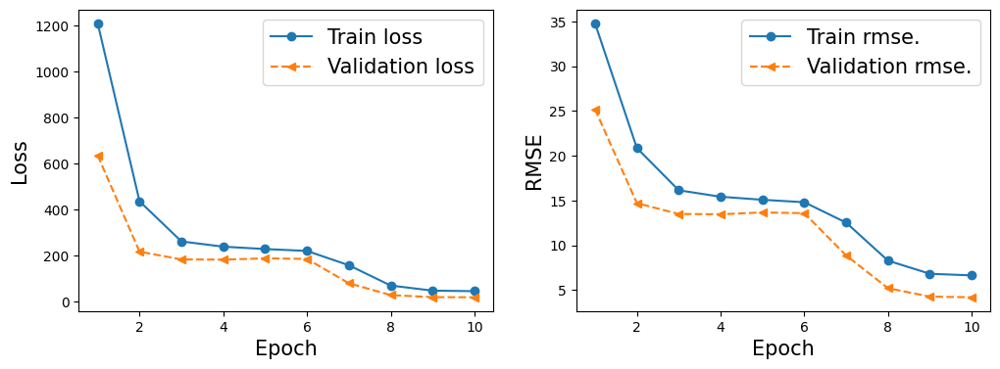

In [ ]:
plot_performance(history)

In [ ]:
X_train_true = process_img(train)
Y_train_true = train.drop("Image", axis=1).to_numpy()
def predict_keypoints(x_train, model):
  train_predictions = model.predict(x_train)
  rand_ims = np.random.choice(x_train.shape[0], 3)
  for im_num in rand_ims:
    print("Actual:")
    plot_1_image(X_train_true[im_num], Y_train_true[im_num])
    print("Predicted:")
    plot_1_image(X_train_true[im_num], train_predictions[im_num])

67/67 [==============================] - 0s 5ms/step
Actual:


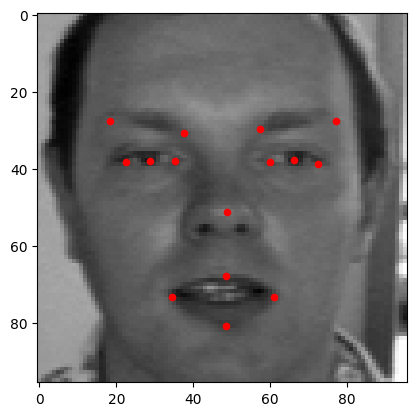

Predicted:


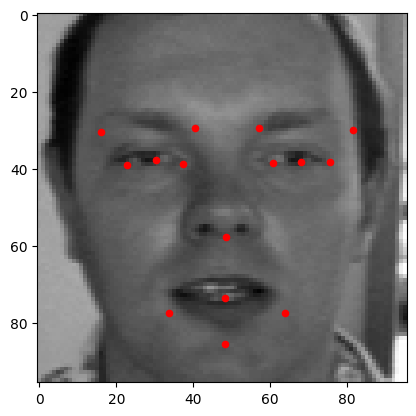

Actual:


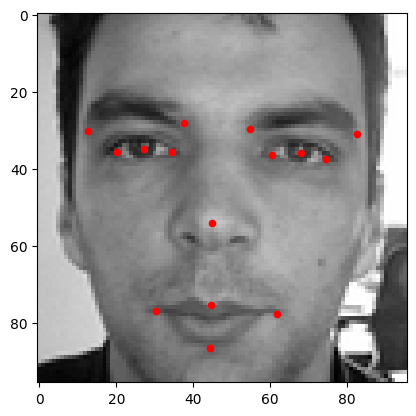

Predicted:


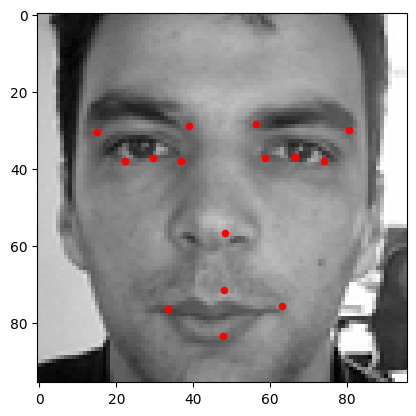

Actual:


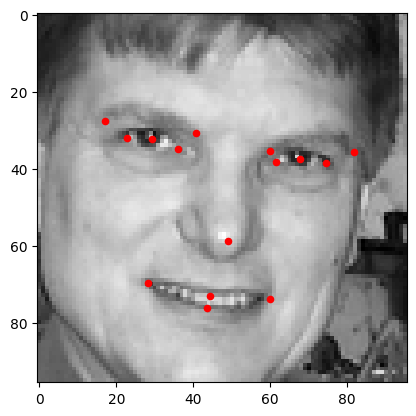

Predicted:


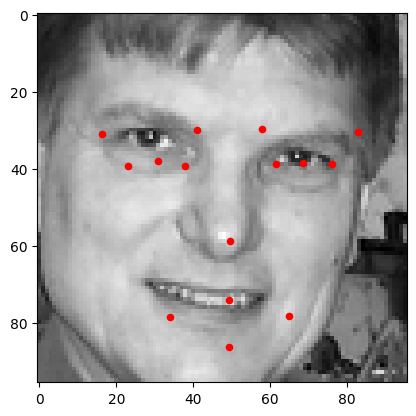

In [ ]:
predict_keypoints(X_train_1, model_1)

# Model 2: Fill Nulls with Feature Averages


In [ ]:
# train_2 = train.fillna(train.mean())
 #^finding mean for nulls in whole table was taking too long,
 #applying mean only on variables with nan values
train2 = train.copy()
for i in train2.columns[train2.isnull().any(axis=0)]:
    train2[i].fillna(train2[i].mean(),inplace=True)

In [ ]:
train2.shape

(7049, 31)

In [ ]:
X_train_2 = process_img(train2)
Y_train_2 = train2.drop("Image", axis=1).to_numpy()

In [ ]:
# define cnn model
def define_big_model():
  tf.keras.backend.clear_session()
  model = Sequential()

  model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(96, 96, 1)))
  model.add(LeakyReLU(alpha = 0.1))
  model.add(BatchNormalization())
  model.add(MaxPooling2D((2, 2)))

  model.add(Conv2D(64, (3, 3), activation='relu'))
  model.add(LeakyReLU(alpha = 0.1))
  model.add(BatchNormalization())
  model.add(MaxPooling2D((2, 2)))

  model.add(Conv2D(128, (3, 3), activation='relu'))
  model.add(LeakyReLU(alpha = 0.1))
  model.add(BatchNormalization())
  model.add(MaxPooling2D((2, 2)))

  model.add(Conv2D(256, (3, 3), activation='relu'))
  model.add(LeakyReLU(alpha = 0.1))
  model.add(BatchNormalization())
  model.add(MaxPooling2D((2, 2)))

  model.add(Conv2D(256, (3, 3), activation='relu'))
  model.add(LeakyReLU(alpha = 0.1))
  model.add(BatchNormalization())
  model.add(MaxPooling2D((2, 2)))

  model.add(Flatten())
  model.add(Dense(50, activation='relu'))
  model.add(Dropout(0.1))
  model.add(Dense(30, activation='relu'))

  # compile model
  opt = keras.optimizers.Adam(learning_rate=0.001)
  model.compile(optimizer=opt, loss='mean_squared_error', metrics=[keras.metrics.RootMeanSquaredError(), 'accuracy'])
  return model

In [ ]:
def define_model_2():
  model = Sequential()

  model.add(Conv2D(64, (3, 3), activation='relu', input_shape=(96, 96, 1)))
  model.add(MaxPooling2D((2, 2)))
  model.add(Conv2D(32, (3, 3), activation='relu'))
  model.add(MaxPooling2D((2, 2)))

  model.add(Flatten())
  model.add(Dense(70, activation='relu'))
  model.add(Dropout(0.1))
  model.add(Dense(30, activation='relu'))

  opt = keras.optimizers.Adam(learning_rate=0.001)
  model.compile(optimizer=opt, loss='mean_squared_logarithmic_error', metrics=[keras.metrics.RootMeanSquaredError()])
  return model

In [ ]:
model_2 = define_model_2()
history_2 = model_2.fit(X_train_2, Y_train_2, epochs = 30, batch_size = 64, validation_split = 0.2)

Epoch 1/30
89/89 [==============================] - 4s 27ms/step - loss: 2.5132 - root_mean_squared_error: 34.2146 - val_loss: 0.5910 - val_root_mean_squared_error: 16.4662
Epoch 2/30
89/89 [==============================] - 2s 20ms/step - loss: 0.6389 - root_mean_squared_error: 16.8673 - val_loss: 0.5237 - val_root_mean_squared_error: 10.9694
Epoch 3/30
89/89 [==============================] - 2s 19ms/step - loss: 0.5863 - root_mean_squared_error: 14.1138 - val_loss: 0.5180 - val_root_mean_squared_error: 10.5149
Epoch 4/30
89/89 [==============================] - 2s 18ms/step - loss: 0.5669 - root_mean_squared_error: 13.2183 - val_loss: 0.5135 - val_root_mean_squared_error: 9.7720
Epoch 5/30
89/89 [==============================] - 2s 23ms/step - loss: 0.5566 - root_mean_squared_error: 12.7525 - val_loss: 0.5122 - val_root_mean_squared_error: 9.8832
Epoch 6/30
89/89 [==============================] - 2s 25ms/step - loss: 0.5500 - root_mean_squared_error: 12.4971 - val_loss: 0.5103 - v

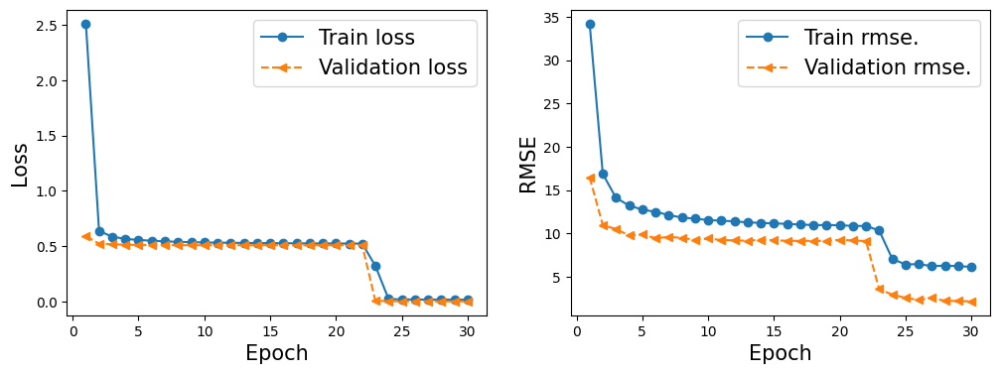

In [ ]:
plot_performance(history_2)

221/221 [==============================] - 1s 3ms/step
Actual:


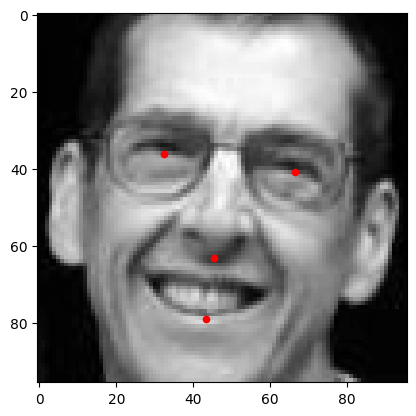

Predicted:


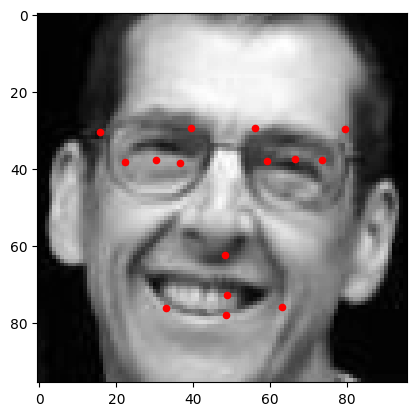

Actual:


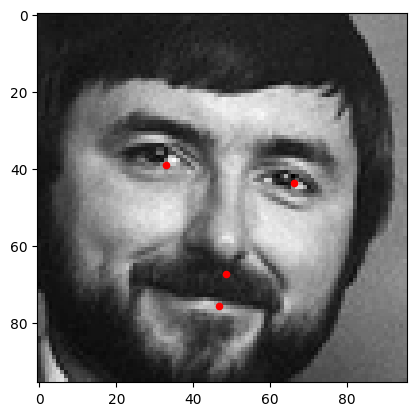

Predicted:


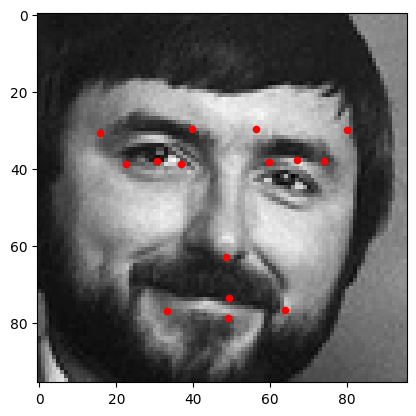

Actual:


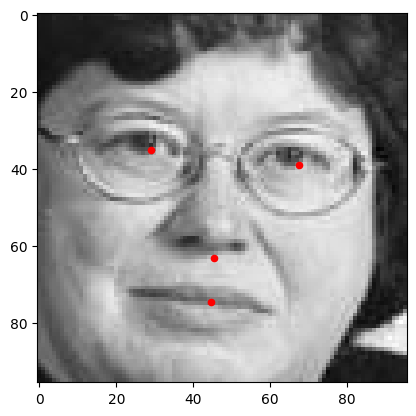

Predicted:


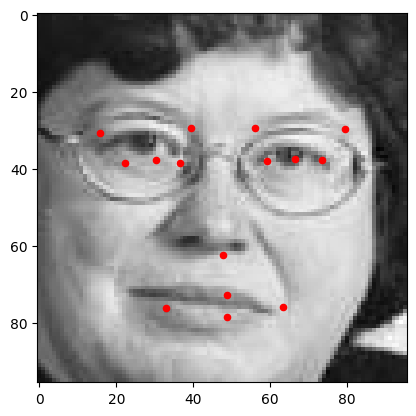

In [ ]:
predict_keypoints(X_train_2, model_2)

In [ ]:
big_model_2 = define_big_model()
big_history_2 = big_model_2.fit(X_train_2, Y_train_2, epochs = 30, batch_size = 64, validation_split = 0.2)

Epoch 1/30
89/89 [==============================] - 9s 38ms/step - loss: 995.7722 - root_mean_squared_error: 31.5559 - accuracy: 0.0523 - val_loss: 700.7279 - val_root_mean_squared_error: 26.4713 - val_accuracy: 0.5738
Epoch 2/30
89/89 [==============================] - 3s 31ms/step - loss: 65.1515 - root_mean_squared_error: 8.0716 - accuracy: 0.3286 - val_loss: 758.8862 - val_root_mean_squared_error: 27.5479 - val_accuracy: 0.5738
Epoch 3/30
89/89 [==============================] - 3s 32ms/step - loss: 48.9494 - root_mean_squared_error: 6.9964 - accuracy: 0.3423 - val_loss: 396.0222 - val_root_mean_squared_error: 19.9003 - val_accuracy: 0.5738
Epoch 4/30
89/89 [==============================] - 3s 33ms/step - loss: 41.8925 - root_mean_squared_error: 6.4724 - accuracy: 0.3687 - val_loss: 57.6933 - val_root_mean_squared_error: 7.5956 - val_accuracy: 0.5993
Epoch 5/30
89/89 [==============================] - 3s 32ms/step - loss: 37.6773 - root_mean_squared_error: 6.1382 - accuracy: 0.383

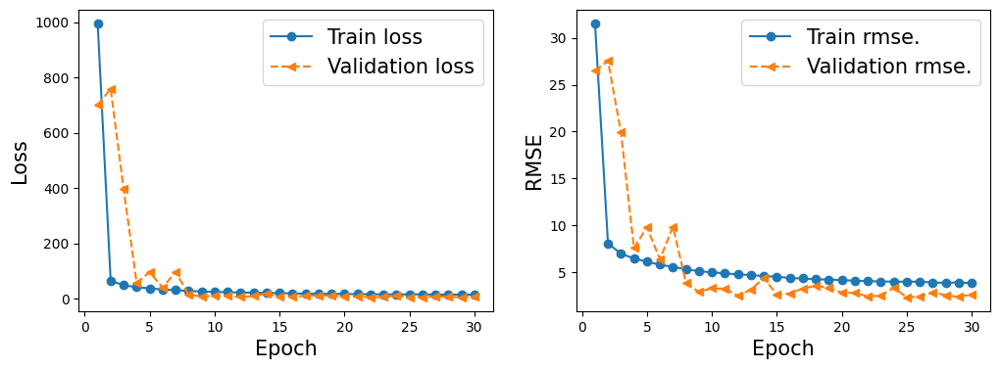

In [ ]:
plot_performance(big_history_2)

221/221 [==============================] - 2s 5ms/step
Actual:


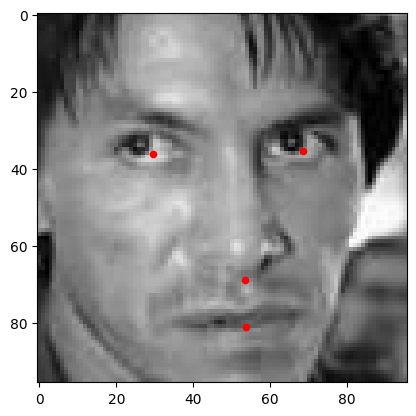

Predicted:


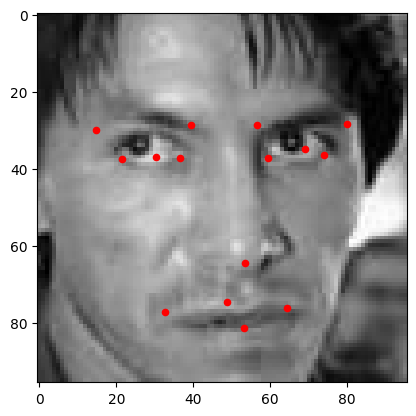

Actual:


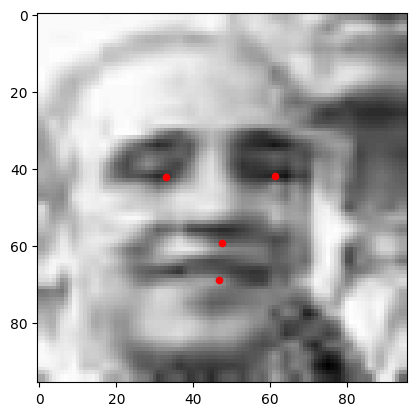

Predicted:


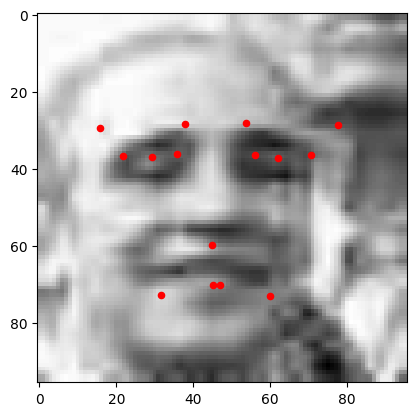

Actual:


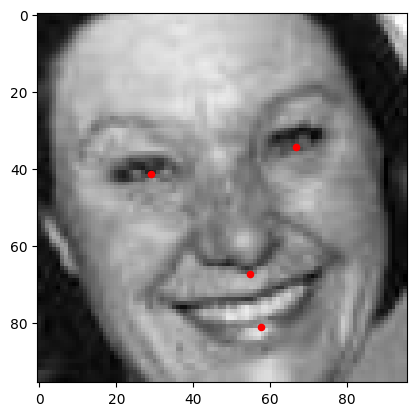

Predicted:


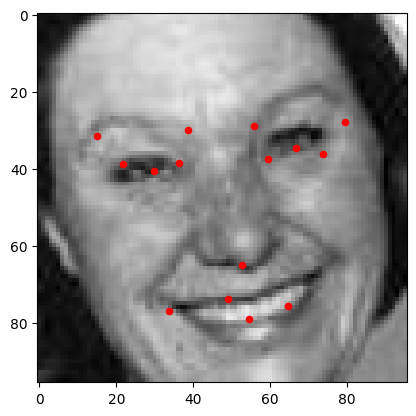

In [ ]:
predict_keypoints(X_train_2, big_model_2)

# Model 3: Predicting Nulls with Simple Linear Regression


Building first model to predict 'left_eye_inner_corner_x'

In [ ]:
#table of columns that have all the data - will be used to train the linear regression model (2237 rows)
train3 = train.dropna()
output_table = train.copy()

In [ ]:
#Making the model and fitting
model3 = smf.ols("left_eye_inner_corner_x ~ left_eye_center_x + right_eye_center_x", data = train3).fit()
print(model3.summary())

                               OLS Regression Results                              
Dep. Variable:     left_eye_inner_corner_x   R-squared:                       0.583
Model:                                 OLS   Adj. R-squared:                  0.583
Method:                      Least Squares   F-statistic:                     1496.
Date:                     Sun, 16 Apr 2023   Prob (F-statistic):               0.00
Time:                             22:27:13   Log-Likelihood:                -3588.4
No. Observations:                     2140   AIC:                             7183.
Df Residuals:                         2137   BIC:                             7200.
Df Model:                                2                                         
Covariance Type:                 nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------

In [ ]:
rows_for_pred = train[train['left_eye_inner_corner_x'].isnull()]
rows_for_pred = rows_for_pred[['left_eye_center_x', 'right_eye_center_x']].dropna()
rows_for_pred

,left_eye_center_x,right_eye_center_x
1654,66.983855,30.778167
1685,65.153204,30.073522
1738,64.698292,30.664127
1742,59.419060,32.745235
1956,62.955221,28.610137
...,...,...
7044,67.402546,29.746749
7045,66.134400,30.478626
7046,66.690732,31.666420
7047,70.965082,30.543285


In [ ]:
preds = model3.predict(rows_for_pred) #statsmodel automatically adds constant
to_table = pd.DataFrame(preds, columns=['left_eye_inner_corner_x'])
output_table = output_table.combine_first(to_table)
output_table.head(3)

,Image,left_eye_center_x,left_eye_center_y,left_eye_inner_corner_x,left_eye_inner_corner_y,left_eye_outer_corner_x,left_eye_outer_corner_y,left_eyebrow_inner_end_x,left_eyebrow_inner_end_y,left_eyebrow_outer_end_x,...,right_eye_center_x,right_eye_center_y,right_eye_inner_corner_x,right_eye_inner_corner_y,right_eye_outer_corner_x,right_eye_outer_corner_y,right_eyebrow_inner_end_x,right_eyebrow_inner_end_y,right_eyebrow_outer_end_x,right_eyebrow_outer_end_y
0,238 236 237 238 240 240 239 241 241 243 240 23...,66.033564,39.002274,59.582075,39.647423,73.130346,39.969997,56.953263,29.033648,80.227128,...,30.227008,36.421678,36.356571,37.389402,23.452872,37.389402,40.227609,29.002322,16.356379,29.647471
1,219 215 204 196 204 211 212 200 180 168 178 19...,64.332936,34.970077,58.856170,35.274349,70.722723,36.187166,53.987404,28.275949,78.634213,...,29.949277,33.448715,36.034723,34.361532,24.472511,33.144443,42.728851,26.146043,16.865362,27.058860
2,144 142 159 180 188 188 184 180 167 132 84 59 ...,65.057053,34.909642,59.412000,36.320968,70.984421,36.320968,55.742526,27.570947,78.887368,...,30.903789,34.909642,37.678105,36.320968,24.976421,36.603221,42.193895,28.135453,16.791158,32.087116


**Predict the other 21 features**

In [ ]:
list_of_columns_to_predict = ['left_eye_inner_corner_y', 'left_eye_outer_corner_x', 'left_eye_outer_corner_y', 'left_eyebrow_inner_end_x',
                              'left_eyebrow_inner_end_y', 'left_eyebrow_outer_end_x', 'left_eyebrow_outer_end_y', 'mouth_center_top_lip_x',
                              'mouth_center_top_lip_y', 'mouth_left_corner_x', 'mouth_left_corner_y', 'mouth_right_corner_x', 'mouth_right_corner_y',
                              'right_eye_inner_corner_x', 'right_eye_inner_corner_y', 'right_eye_outer_corner_x', 'right_eye_outer_corner_y',
                              'right_eyebrow_inner_end_x', 'right_eyebrow_inner_end_y', 'right_eyebrow_outer_end_x', 'right_eyebrow_outer_end_y']

In [ ]:
for column in list_of_columns_to_predict:
  correlated_features = train.corr()[column].sort_values(ascending = False)[['left_eye_center_x', 'right_eye_center_x', 'right_eye_center_y', 'nose_tip_x', 'nose_tip_y', 'mouth_center_bottom_lip_x', 'mouth_center_bottom_lip_y']].index
  formula = (column + "~" + correlated_features[0] + '+' + correlated_features[1])
  model = smf.ols(formula=formula, data = train3).fit()
  select = train[train[column].isnull()]
  select = select[['left_eye_center_x', 'left_eye_center_y', 'right_eye_center_x', 'right_eye_center_y', 'nose_tip_x', 'nose_tip_y', 'mouth_center_bottom_lip_x', 'mouth_center_bottom_lip_y']].dropna()
  predictions = model.predict(select)
  to_df = pd.DataFrame(predictions, columns=[column])
  output_table = output_table.combine_first(to_df)


<ipython-input-36-bb9f4c1a4575>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlated_features = train.corr()[column].sort_values(ascending = False)[['left_eye_center_x', 'right_eye_center_x', 'right_eye_center_y', 'nose_tip_x', 'nose_tip_y', 'mouth_center_bottom_lip_x', 'mouth_center_bottom_lip_y']].index
<ipython-input-36-bb9f4c1a4575>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlated_features = train.corr()[column].sort_values(ascending = False)[['left_eye_center_x', 'right_eye_center_x', 'right_eye_center_y', 'nose_tip_x', 'nose_tip_y', 'mouth_center_bottom_lip_x', 'mouth_center_bottom_lip_y']].index
<ipython-input-36-bb9f4c1a

In [ ]:
final = output_table.dropna()
final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7000 entries, 0 to 7048
Data columns (total 31 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Image                      7000 non-null   object 
 1   left_eye_center_x          7000 non-null   float64
 2   left_eye_center_y          7000 non-null   float64
 3   left_eye_inner_corner_x    7000 non-null   float64
 4   left_eye_inner_corner_y    7000 non-null   float64
 5   left_eye_outer_corner_x    7000 non-null   float64
 6   left_eye_outer_corner_y    7000 non-null   float64
 7   left_eyebrow_inner_end_x   7000 non-null   float64
 8   left_eyebrow_inner_end_y   7000 non-null   float64
 9   left_eyebrow_outer_end_x   7000 non-null   float64
 10  left_eyebrow_outer_end_y   7000 non-null   float64
 11  mouth_center_bottom_lip_x  7000 non-null   float64
 12  mouth_center_bottom_lip_y  7000 non-null   float64
 13  mouth_center_top_lip_x     7000 non-null   float

In [ ]:
X_train_3 = process_img(final)
Y_train_3 = final.drop("Image", axis=1).to_numpy()

In [ ]:
def define_model3():
  tf.keras.backend.clear_session()

  model = Sequential()

  model.add(tf.keras.layers.InputLayer(input_shape=X_train[0].shape))

  model.add(Conv2D(64, (3, 3), activation='sigmoid'))
  model.add(MaxPooling2D((2, 2)))
  model.add(Conv2D(32, (3, 3), activation='relu'))
  model.add(MaxPooling2D((2, 2)))

  model.add(Flatten())
  model.add(Dense(50, activation='sigmoid'))
  model.add(Dropout(0.1))
  model.add(Dense(30, activation='relu'))
  model.add(Dropout(0.1))
  model.add(Dense(30, activation='relu'))

  opt = keras.optimizers.Adam(learning_rate=0.001)
  model.compile(optimizer=opt, loss='mean_squared_logarithmic_error', metrics=[keras.metrics.RootMeanSquaredError()])
  return model

In [ ]:
model3 = define_model3()
history3 = model3.fit(X_train_3, Y_train_3, epochs = 20, batch_size = 50, validation_split = 0.2)

Epoch 1/20
112/112 [==============================] - 4s 19ms/step - loss: 6.9545 - root_mean_squared_error: 47.8552 - val_loss: 3.1276 - val_root_mean_squared_error: 43.7504
Epoch 2/20
112/112 [==============================] - 2s 17ms/step - loss: 1.7249 - root_mean_squared_error: 38.8419 - val_loss: 0.8055 - val_root_mean_squared_error: 33.5601
Epoch 3/20
112/112 [==============================] - 2s 18ms/step - loss: 0.4932 - root_mean_squared_error: 28.8348 - val_loss: 0.2582 - val_root_mean_squared_error: 24.1451
Epoch 4/20
112/112 [==============================] - 2s 19ms/step - loss: 0.1880 - root_mean_squared_error: 21.1945 - val_loss: 0.1047 - val_root_mean_squared_error: 17.6091
Epoch 5/20
112/112 [==============================] - 2s 17ms/step - loss: 0.0944 - root_mean_squared_error: 16.1166 - val_loss: 0.0500 - val_root_mean_squared_error: 12.9910
Epoch 6/20
112/112 [==============================] - 2s 17ms/step - loss: 0.0559 - root_mean_squared_error: 12.5673 - val_lo

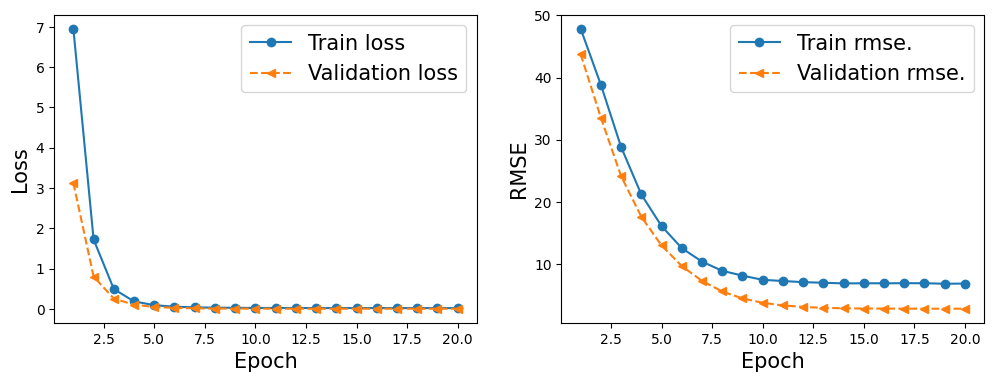

In [ ]:
plot_performance(history3)

219/219 [==============================] - 1s 4ms/step
Actual:


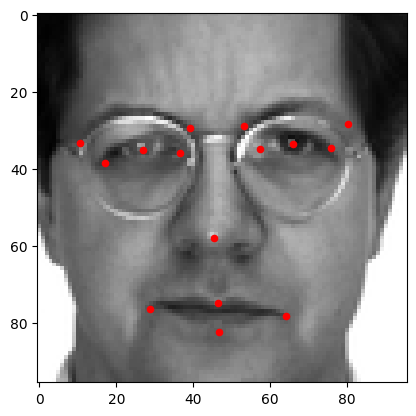

Predicted:


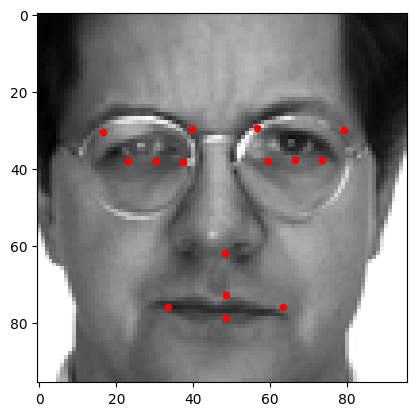

Actual:


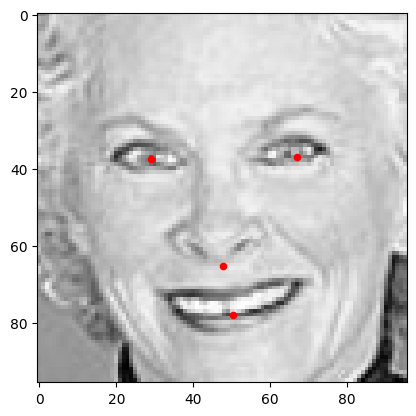

Predicted:


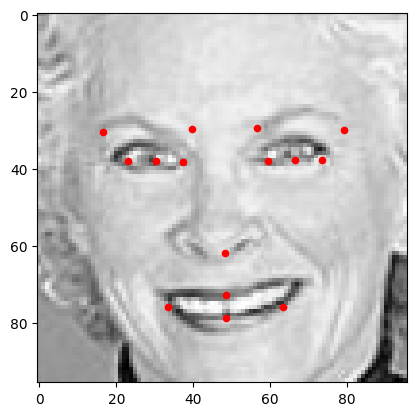

Actual:


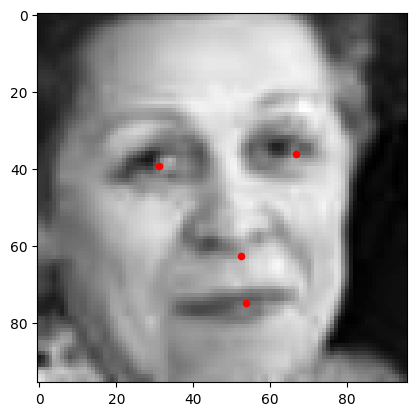

Predicted:


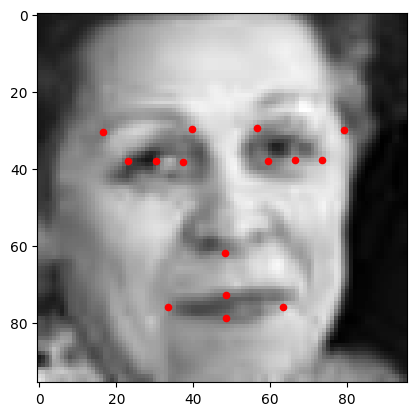

In [ ]:
predict_keypoints(X_train_3, model3)

# Model 4: Predicting Nulls with Multiple Linear Regression

In [ ]:
train4 = train.dropna()
final_table = train.copy()

In [ ]:
list_of_columns_to_predict2 = ['left_eye_inner_corner_x', 'left_eye_inner_corner_y', 'left_eye_outer_corner_x', 'left_eye_outer_corner_y', 'left_eyebrow_inner_end_x',
                              'left_eyebrow_inner_end_y', 'left_eyebrow_outer_end_x', 'left_eyebrow_outer_end_y', 'mouth_center_top_lip_x',
                              'mouth_center_top_lip_y', 'mouth_left_corner_x', 'mouth_left_corner_y', 'mouth_right_corner_x', 'mouth_right_corner_y',
                              'right_eye_inner_corner_x', 'right_eye_inner_corner_y', 'right_eye_outer_corner_x', 'right_eye_outer_corner_y',
                              'right_eyebrow_inner_end_x', 'right_eyebrow_inner_end_y', 'right_eyebrow_outer_end_x', 'right_eyebrow_outer_end_y']

In [ ]:
for column in list_of_columns_to_predict2:
  formula = (column + "~" + "left_eye_center_x + left_eye_center_y + right_eye_center_x + right_eye_center_y + nose_tip_x + nose_tip_y + mouth_center_bottom_lip_x + mouth_center_bottom_lip_y")
  model4 = smf.ols(formula=formula, data = train4).fit()
  select = train[train[column].isnull()]
  select = select[['left_eye_center_x', 'left_eye_center_y', 'right_eye_center_x', 'right_eye_center_y', 'nose_tip_x', 'nose_tip_y', 'mouth_center_bottom_lip_x', 'mouth_center_bottom_lip_y']].dropna()
  predictions = model4.predict(select)
  to_df = pd.DataFrame(predictions, columns=[column])
  final_table = final_table.combine_first(to_df)

In [ ]:
final4 = final_table.dropna()
final4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7000 entries, 0 to 7048
Data columns (total 31 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Image                      7000 non-null   object 
 1   left_eye_center_x          7000 non-null   float64
 2   left_eye_center_y          7000 non-null   float64
 3   left_eye_inner_corner_x    7000 non-null   float64
 4   left_eye_inner_corner_y    7000 non-null   float64
 5   left_eye_outer_corner_x    7000 non-null   float64
 6   left_eye_outer_corner_y    7000 non-null   float64
 7   left_eyebrow_inner_end_x   7000 non-null   float64
 8   left_eyebrow_inner_end_y   7000 non-null   float64
 9   left_eyebrow_outer_end_x   7000 non-null   float64
 10  left_eyebrow_outer_end_y   7000 non-null   float64
 11  mouth_center_bottom_lip_x  7000 non-null   float64
 12  mouth_center_bottom_lip_y  7000 non-null   float64
 13  mouth_center_top_lip_x     7000 non-null   float

In [ ]:
X_train4 = process_img(final4)
Y_train4 = final4.drop("Image", axis=1).to_numpy()

In [ ]:
def define_model4():
  tf.keras.backend.clear_session()

  model = Sequential()

  model.add(tf.keras.layers.InputLayer(input_shape=X_train[0].shape))


  model.add(Conv2D(64, (3, 3), activation='sigmoid'))
  model.add(MaxPooling2D((2, 2)))
  model.add(Conv2D(32, (3, 3), activation='relu'))
  model.add(MaxPooling2D((2, 2)))

  model.add(Flatten())
  model.add(Dense(50, activation='sigmoid'))
  model.add(Dropout(0.1))
  model.add(Dense(30, activation='relu'))
  model.add(Dropout(0.1))
  model.add(Dense(30, activation='relu'))

  # compile model
  opt = keras.optimizers.Adam(learning_rate=0.001)
  model.compile(optimizer=opt, loss='mean_squared_logarithmic_error', metrics=[keras.metrics.RootMeanSquaredError()])
  return model

In [ ]:
model4cnn = define_model4()
history4 = model4cnn.fit(X_train4, Y_train4, epochs = 20, batch_size = 50, validation_split = 0.2)

Epoch 1/20
112/112 [==============================] - 4s 21ms/step - loss: 8.7852 - root_mean_squared_error: 49.6332 - val_loss: 4.9534 - val_root_mean_squared_error: 47.5348
Epoch 2/20
112/112 [==============================] - 2s 19ms/step - loss: 3.4587 - root_mean_squared_error: 43.7962 - val_loss: 2.4460 - val_root_mean_squared_error: 40.7432
Epoch 3/20
112/112 [==============================] - 2s 17ms/step - loss: 1.9365 - root_mean_squared_error: 36.4208 - val_loss: 1.5606 - val_root_mean_squared_error: 32.6914
Epoch 4/20
112/112 [==============================] - 2s 18ms/step - loss: 1.3796 - root_mean_squared_error: 28.7030 - val_loss: 1.2566 - val_root_mean_squared_error: 25.6861
Epoch 5/20
112/112 [==============================] - 2s 18ms/step - loss: 0.8448 - root_mean_squared_error: 22.7229 - val_loss: 0.7253 - val_root_mean_squared_error: 20.6592
Epoch 6/20
112/112 [==============================] - 2s 18ms/step - loss: 0.7107 - root_mean_squared_error: 19.5809 - val_lo

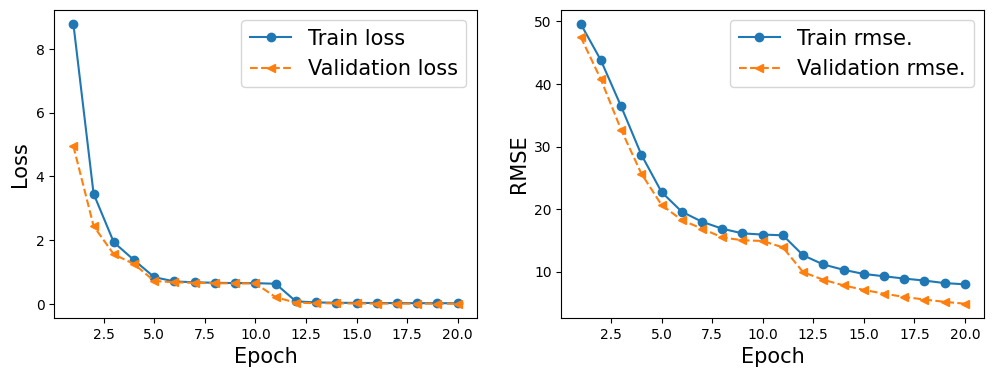

In [ ]:
plot_performance(history4)

219/219 [==============================] - 1s 4ms/step
Actual:


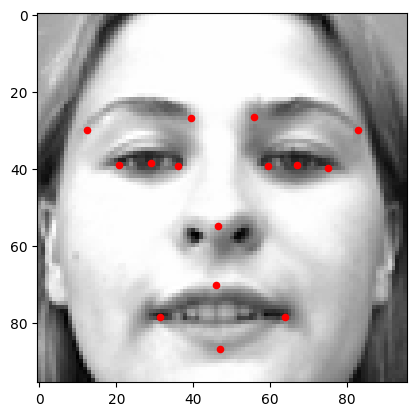

Predicted:


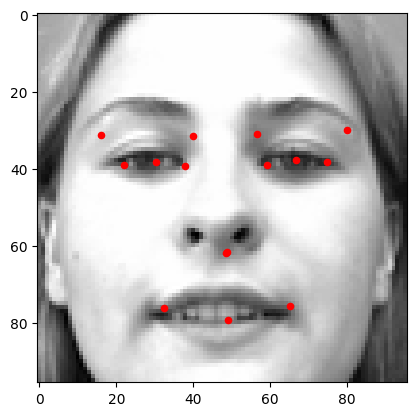

Actual:


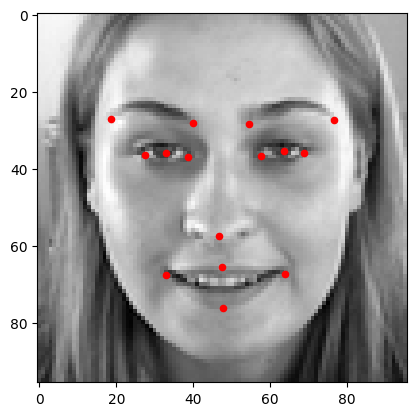

Predicted:


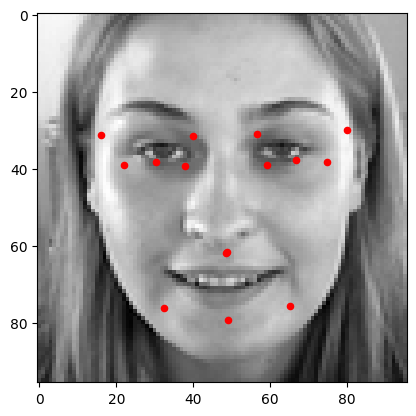

Actual:


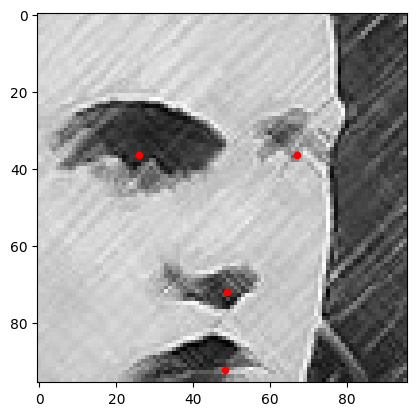

Predicted:


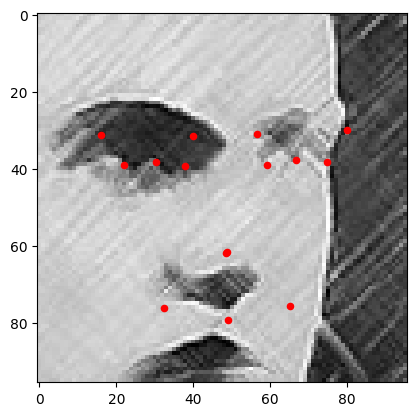

In [ ]:
predict_keypoints(X_train4, model4cnn)

# Model 5: Data Augmentation





In [ ]:
good_data = train.dropna()
good_data.shape

(2140, 31)

In [ ]:
images = process_img(good_data)
keypoints = good_data.drop("Image", axis=1).to_numpy()

Horizontal Flip

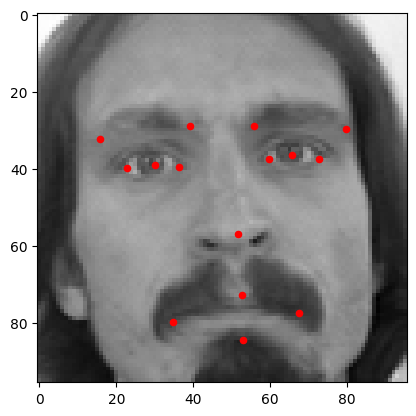

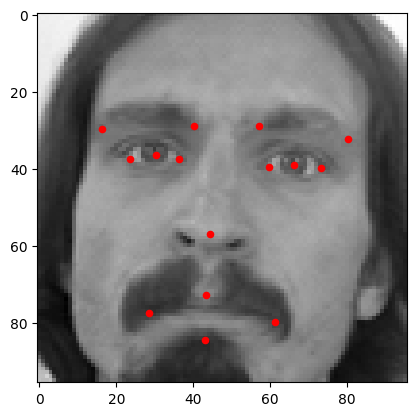

None None


In [ ]:
sample, keypoint = images[0].copy(), keypoints[0].copy()

flipped = np.flip(sample, axis=1)
flipped_keypoint = keypoint.copy()
for i, v in enumerate(flipped_keypoint):
  if i%2 == 0:
    flipped_keypoint[i] = 96-v

print(plot_1_image(flipped, flipped_keypoint), plot_1_image(sample, keypoint))

In [ ]:
def horizontal_flip(images, keypoints):
  flipped_images = np.flip(images, axis=2)
  flipped_keypoints = keypoints.copy()
  for i, key in enumerate(flipped_keypoints):
    for j, val in enumerate(key):
      if j%2 == 0:
        flipped_keypoints[i][j] = 96 - val
  return flipped_images, flipped_keypoints

flipped_images, flipped_keypoints = horizontal_flip(images, keypoints)

Adjust Brightness and Contrast

In [ ]:
# adjust brightness
X_train_augm = tf.image.adjust_brightness(flipped_images, delta=0.3)

# adjust contrast
X_train_augm = tf.image.adjust_contrast(X_train_augm, contrast_factor=3)

In [ ]:
X_train5 = np.concatenate((images, X_train_augm))
Y_train5 = np.concatenate((keypoints, flipped_keypoints))

print(X_train5.shape)
print(Y_train5.shape)

(4280, 96, 96, 1)
(4280, 30)


In [ ]:
# define cnn model
def define_model5():
  tf.keras.backend.clear_session()
  model = Sequential()

  model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(96, 96, 1)))
  model.add(MaxPooling2D((2, 2)))
  model.add(Conv2D(64, (3, 3), activation='relu'))
  model.add(MaxPooling2D((2, 2)))
  model.add(Conv2D(128, (3, 3), activation='relu'))
  model.add(MaxPooling2D((2, 2)))
  model.add(Conv2D(64, (3, 3), activation='relu'))
  model.add(MaxPooling2D((2, 2)))
  model.add(Conv2D(32, (3, 3), activation='relu'))
  model.add(MaxPooling2D((2, 2)))

  model.add(Flatten())
  model.add(Dense(50, activation='relu'))
  model.add(Dropout(0.1))
  model.add(Dense(30, activation='relu'))
  model.add(Dropout(0.1))
  model.add(Dense(30, activation='relu'))

  # compile model
  opt = keras.optimizers.Adam(learning_rate=0.001)
  model.compile(optimizer=opt, loss='mean_squared_logarithmic_error', metrics=[keras.metrics.RootMeanSquaredError()])
  return model

In [ ]:
model5 = define_model5()
history5 = model5.fit(X_train5, Y_train5, epochs = 20, batch_size = 64, validation_split = 0.2)

Epoch 1/20
54/54 [==============================] - 5s 32ms/step - loss: 5.9439 - root_mean_squared_error: 68.4207 - val_loss: 2.8823 - val_root_mean_squared_error: 61.2749
Epoch 2/20
54/54 [==============================] - 1s 19ms/step - loss: 1.2954 - root_mean_squared_error: 32.9506 - val_loss: 1.0784 - val_root_mean_squared_error: 37.6253
Epoch 3/20
54/54 [==============================] - 1s 20ms/step - loss: 0.6729 - root_mean_squared_error: 24.9159 - val_loss: 0.8184 - val_root_mean_squared_error: 22.9047
Epoch 4/20
54/54 [==============================] - 1s 22ms/step - loss: 0.5643 - root_mean_squared_error: 19.3022 - val_loss: 0.7384 - val_root_mean_squared_error: 19.4639
Epoch 5/20
54/54 [==============================] - 1s 22ms/step - loss: 0.5300 - root_mean_squared_error: 18.2574 - val_loss: 0.2645 - val_root_mean_squared_error: 36.5075
Epoch 6/20
54/54 [==============================] - 1s 22ms/step - loss: 0.1767 - root_mean_squared_error: 17.5232 - val_loss: 0.0858 -

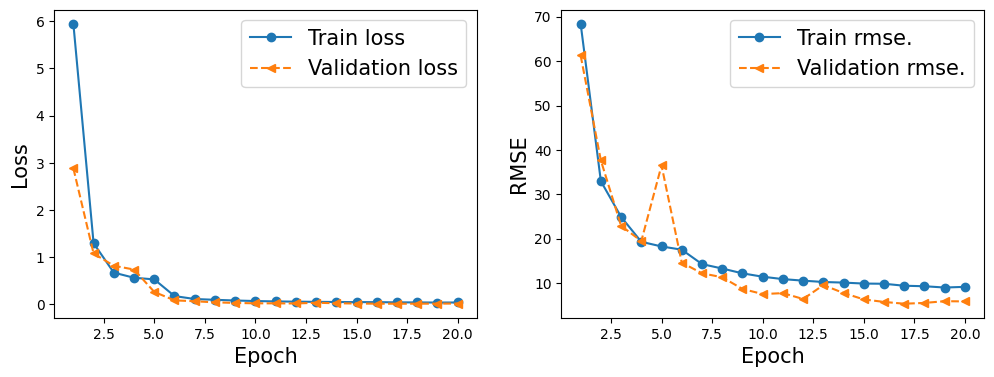

In [ ]:
plot_performance(history5)

134/134 [==============================] - 1s 3ms/step
Actual:


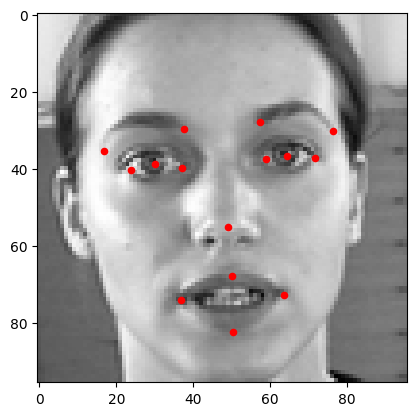

Predicted:


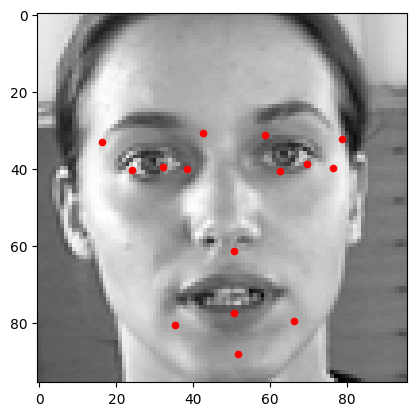

Actual:


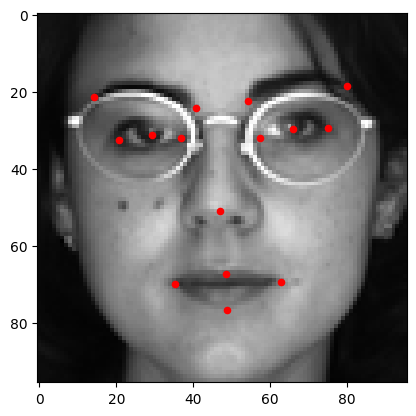

Predicted:


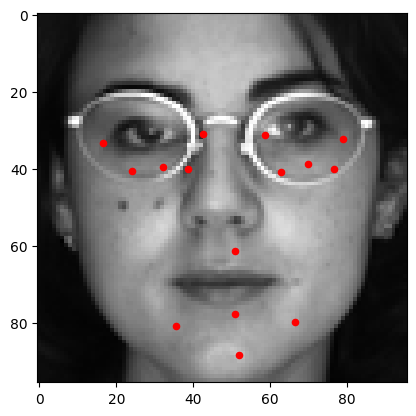

Actual:


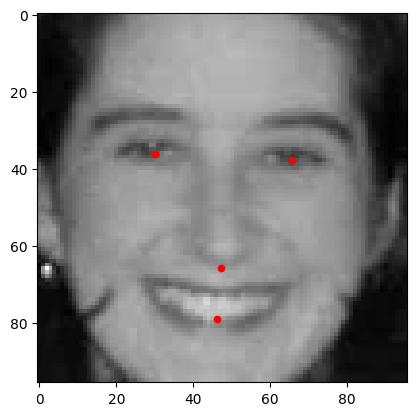

Predicted:


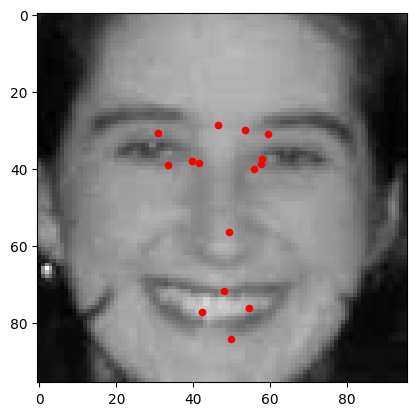

In [ ]:
predict_keypoints(X_train5, model5)

# Evaluate Model 5 Performance on Test Data

In [ ]:
X_test = process_img(test)
test_predictions = model5.predict(X_test)

56/56 [==============================] - 0s 4ms/step


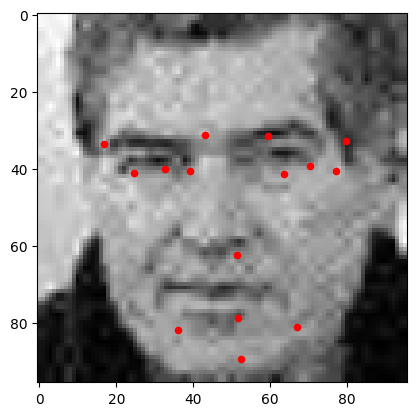

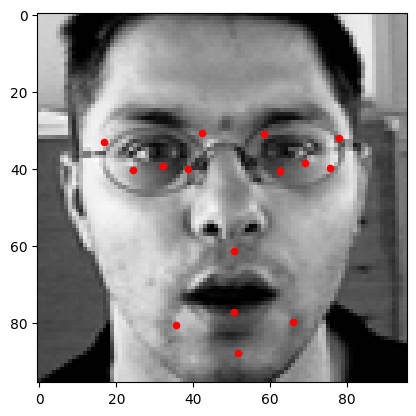

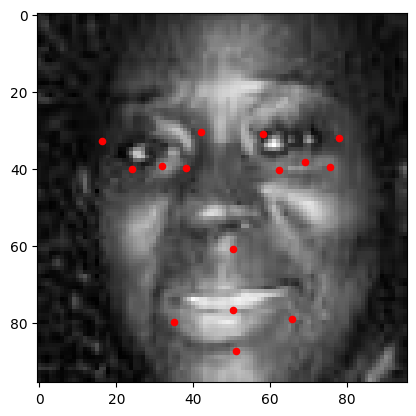

In [ ]:
#Since the model is generating new keypoints for the test images,
#it is difficult to judge how well it is performing besides visually
rand_ims = np.random.choice(X_test.shape[0], 3)
for im_num in rand_ims:
  plot_1_image(X_test[im_num], test_predictions[im_num])

# Key Takeaways



*   Quality over quantity
  * Less training data that was more accurate was more useful than more training data with predicted nulls
  * It seems most worth our time to pursue data augmentation further



# Next Steps:



*   Pursue data augmentation
    * rotation
    * adding noise
    * scaling
    * cropping
*   Once we are satisfied with this model
    * Adapt to masks etc by cropping out bottom of image



